In [2]:
import xarray as xr
import xesmf as xe
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import dask
import cftime
import random
import glob
import matplotlib.gridspec as gs
import pint_xarray
import cf_xarray as cfxr
from eofs.xarray import Eof

In [3]:
from dask.distributed import Client, LocalCluster
client = Client()
client

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 33171 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/33171/status,
Dashboard: /proxy/33171/status,Workers: 7
Total threads: 7,Total memory: 32.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37665,Workers: 7
Dashboard: /proxy/33171/status,Total threads: 7
Started: Just now,Total memory: 32.00 GiB
Comm: tcp://127.0.0.1:43193,Total threads: 1
Dashboard: /proxy/37523/status,Memory: 4.57 GiB
Nanny: tcp://127.0.0.1:45257,


In [4]:
#load in ctrl dataset
ctrl_ds = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/ctrl_sst.nc",  use_cftime=True, chunks= {"time":240})
ctrl = ctrl_ds.sst.compute()

In [90]:
def roll_lon(df):
    df.coords['xt_ocean'] = (df.coords['xt_ocean'] + 360) % 360# - 180
    df = df.sortby(df.xt_ocean)
    return df

In [91]:
ctrl = roll_lon(ctrl)

In [92]:
exp_dir = "/scratch/e14/sm2435/archive/"

In [93]:
suffix = "/history/ocn/ocean_month.nc*"

In [94]:
Idea_list = ["df440", "df442"]

In [95]:
new_time = ctrl.time[0:24]

In [ ]:
/g/data/e14/sm2435/Pacemaker/Ideal_anom_EP/0970/Idealised_EP_anomaly_YEAR.nc

In [56]:
EP = xr.open_dataset("/scratch/e14/sm2435/archive/df440/history/ocn/ocean_month.nc-09901231", use_cftime=True)
CP = xr.open_dataset("/scratch/e14/sm2435/archive/df478/history/ocn/ocean_daily.nc-09701231", use_cftime=True)


In [43]:
ctrl_clim = xr.open_dataset("/g/data/e14/sm2435/Pacemaker/global_sst_restoring_cm000_climatology_0951-1150.nc", decode_times=False)

In [44]:
ctrl_clim = ctrl_clim.rename({"TIME":"time", "GRID_Y_T":"yt_ocean", "GRID_X_T": "xt_ocean"})

In [45]:
ctrl_clim = ctrl_clim.temp[:,0].drop("DEPTH1_1")

In [58]:
ctrl_clim =ctrl_clim.assign_coords({"time": EP.time})

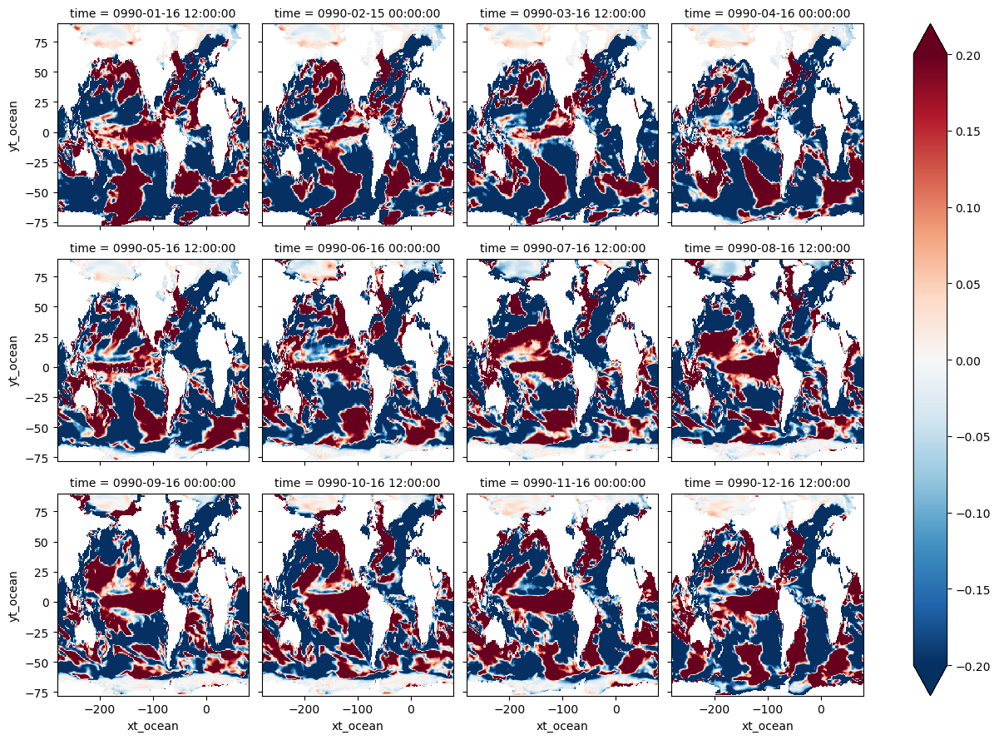

In [89]:
(EP.sst - ctrl_clim).plot(col = "time", col_wrap = 4, vmin = -0.2)

In [63]:
ctrl97 = xr.open_dataset("/g/data/hh5/tmp/zg0866/cm000_APP4_archive/cm000/history/ocn/ocean_daily.nc-09701231", use_cftime=True)
ctrl99m = xr.open_dataset("/g/data/hh5/tmp/zg0866/cm000_APP4_archive/cm000/history/ocn/ocean_month.nc-09901231", use_cftime=True)


In [68]:
ctrl99m = ctrl99m.assign_coords({"time": EP.time})

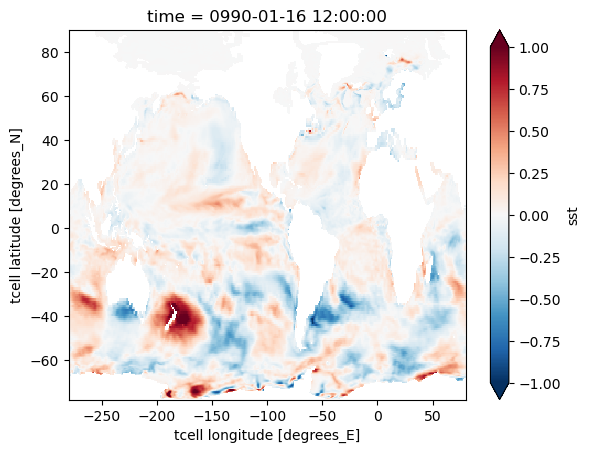

In [87]:
(EP.sst - ctrl99m.sst)[0].plot(vmin = -1)

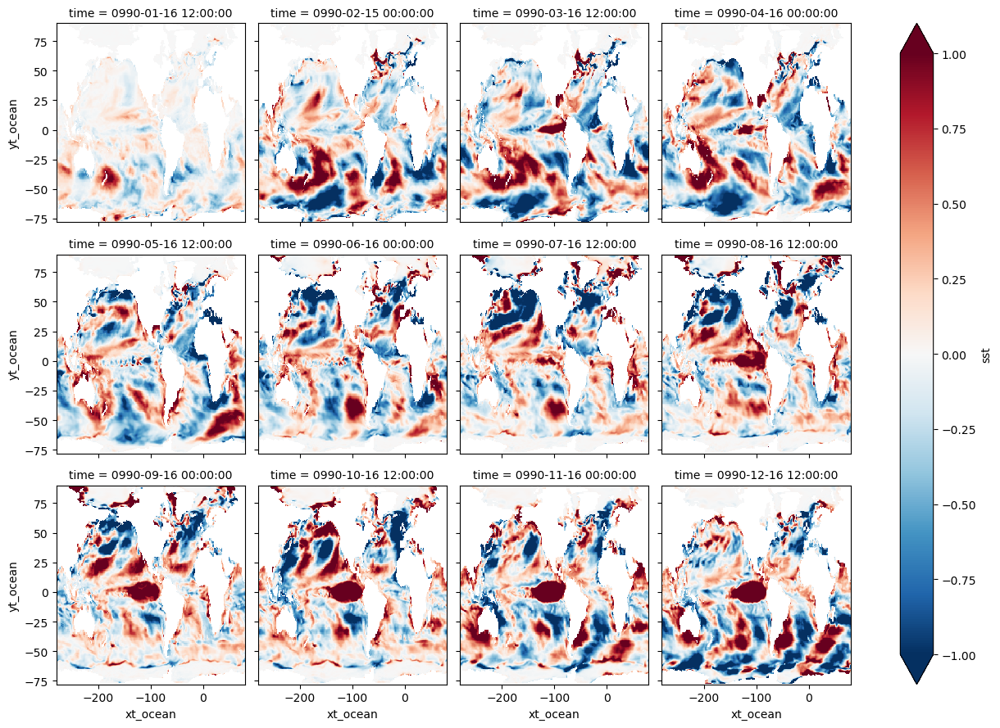

In [71]:
(EP.sst - ctrl99m.sst).plot(col = "time", col_wrap = 4, vmin = -1)

In [79]:
EPd = xr.open_dataset("/scratch/e14/sm2435/archive/df440/history/ocn/ocean_daily.nc-09901231", use_cftime=True)
ctrl99d = xr.open_dataset("/g/data/hh5/tmp/zg0866/cm000_APP4_archive/cm000/history/ocn/ocean_daily.nc-09901231", use_cftime=True)


/jobfs/114874022.gadi-pbs/ipykernel_3567455/1971012993.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


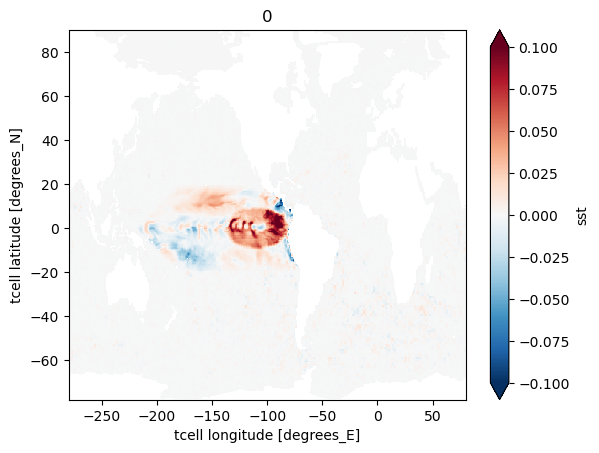

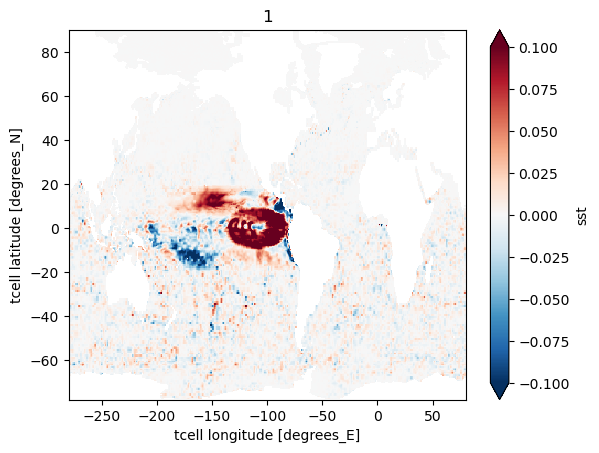

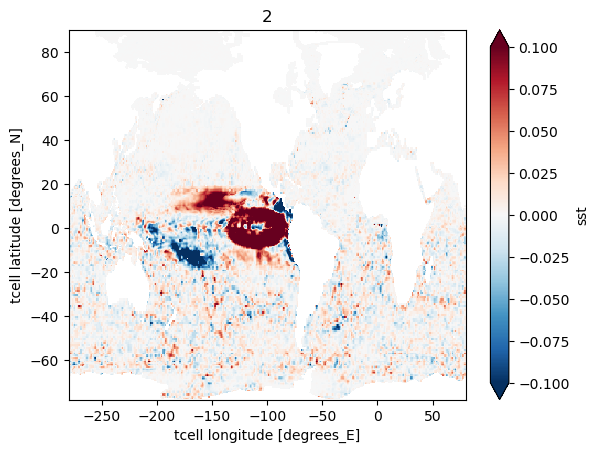

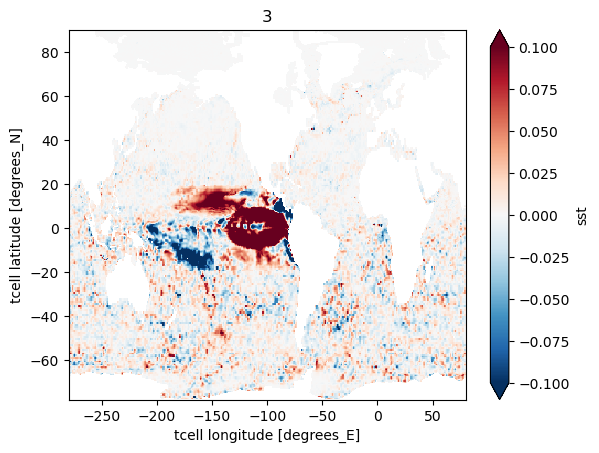

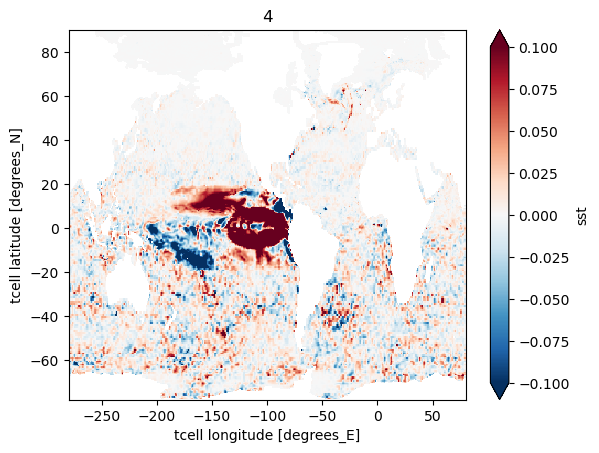

...

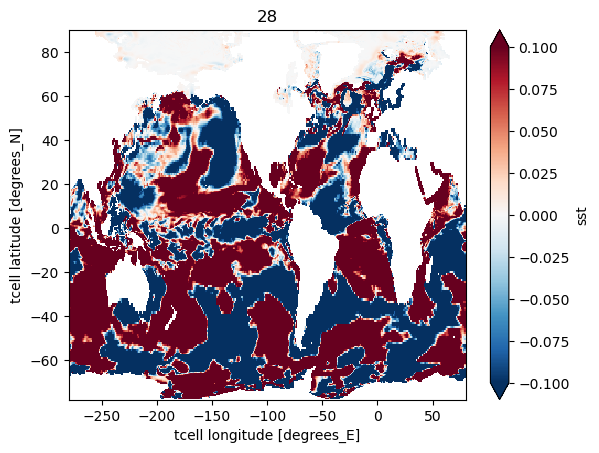

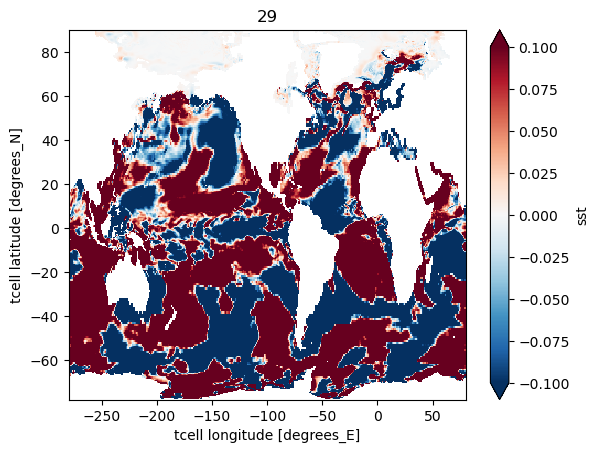

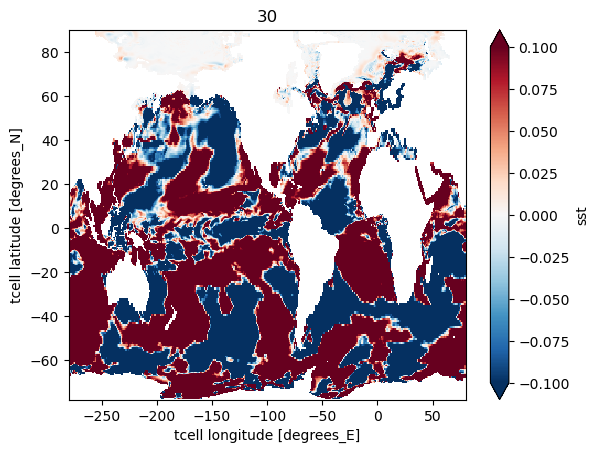

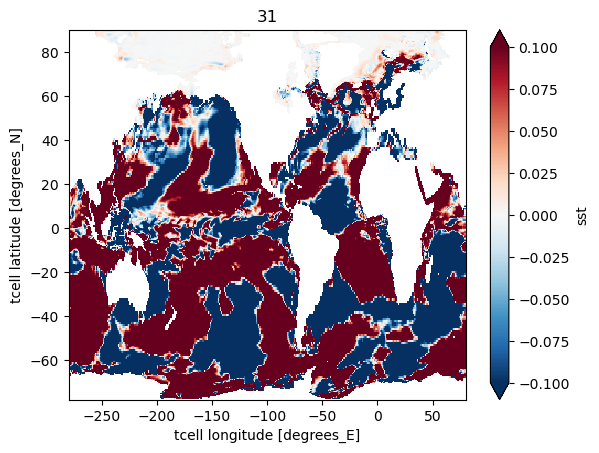

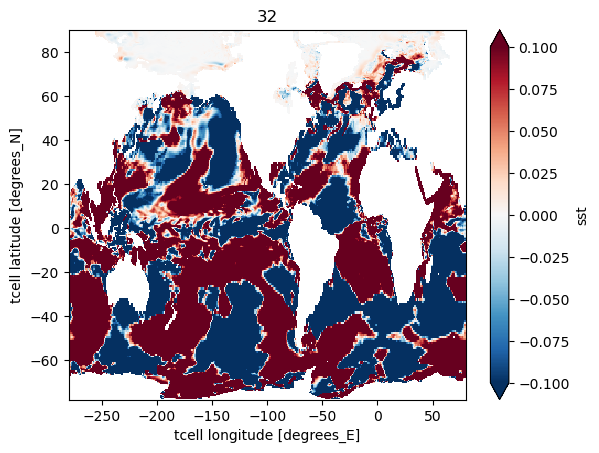

In [88]:
for i in range(0,33,1):
    plt.figure()
    (EPd.sst[i] - ctrl99d.sst[i]).plot(vmin = -0.1)
    plt.title(i)

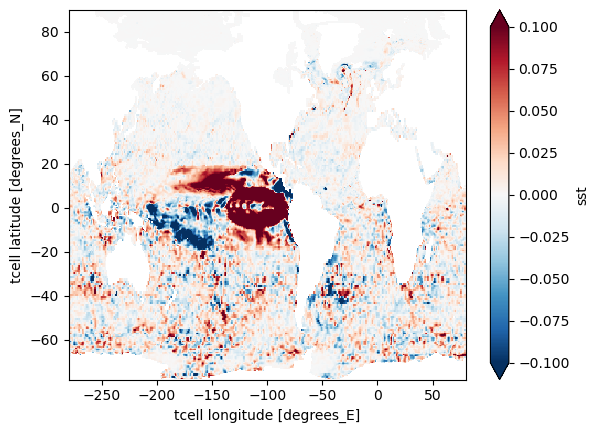

In [84]:
(EPd.sst[5] - ctrl99d.sst[5]).plot(vmin = -0.1)

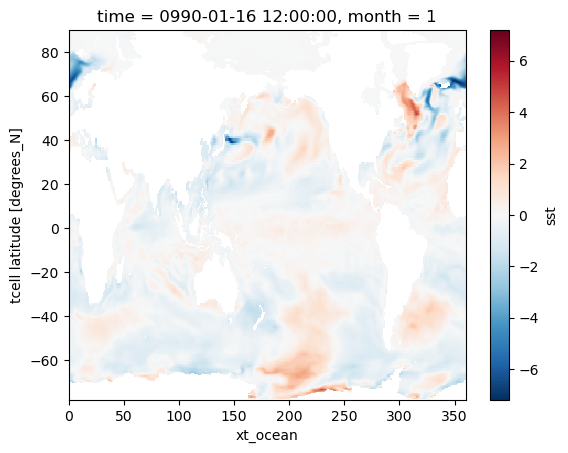

In [38]:
(roll_lon(CP.sst[0]) - roll_lon(ctrl.groupby("time.month").mean("time")[0])).plot()

In [41]:
mask1= xr.open_dataset("/home/561/sm2435/cylc-run/u-df440/work/09900101/coupled/OCN_RUNDIR/INPUT/temp_sfc_restore.nc", decode_times = False)

In [42]:
mask2= xr.open_dataset("/home/561/sm2435/cylc-run/u-df442/work/09900101/coupled/OCN_RUNDIR/INPUT/temp_sfc_restore.nc", decode_times = False)

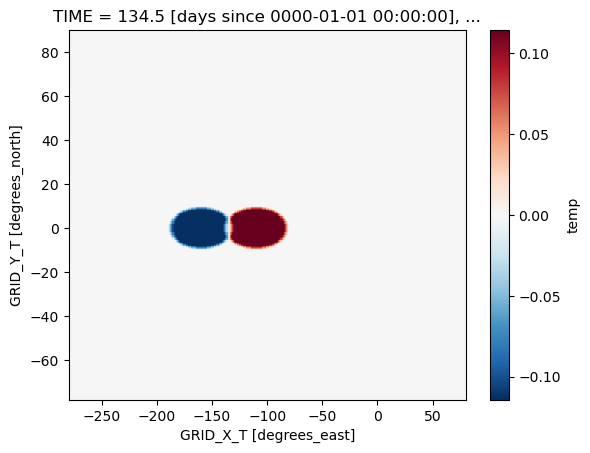

In [45]:
(mask1.temp[4,0] - mask2.temp[4,0]).plot()

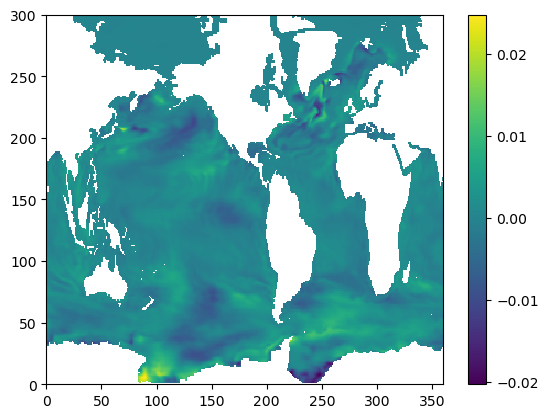

In [34]:
plt.pcolormesh(mask.temp[0,0].values - ctrl.groupby("time.month").mean("time")[0].values)
plt.colorbar()

In [98]:
(exp_dir+exp+suffix)

'/scratch/e14/sm2435/archive/df440/history/ocn/ocean_month.nc*'

In [101]:
idea_dict={}
for exp in Idea_list:
    ds = xr.open_mfdataset(exp_dir+exp+suffix, use_cftime=True, chunks= {"time":12})
    sst = ds.sst
    sst = roll_lon(sst)
    #change the time to 0000
    sst['time'] = new_time
    sst.coords['exp'] = exp
    idea_dict[exp] = sst

In [11]:
def roll_lon_u(df):
    df.coords['xu_ocean'] = (df.coords['xu_ocean'] + 360) % 360# - 180
    df = df.sortby(df.xu_ocean)
    return df

In [12]:
idea_dict_wind={}
for exp in Idea_list:
    ds = xr.open_mfdataset(exp_dir+exp+suffix, use_cftime=True, chunks= {"time":12})
    sst = ds.tau_x
    sst = roll_lon_u(sst)
    #change the time to 0000
    sst['time'] = new_time
    sst.coords['exp'] = exp
    idea_dict_wind[exp] = sst

In [102]:
def ssta(DS):
    clim = DS.groupby('time.month').mean('time')
    ssta = DS.groupby('time.month') - clim
    return ssta.drop("month")
def DMI_ctrl(DS):
    WTIO =  ssta(DS).sel(yt_ocean=slice(
         -10, 10),xt_ocean=slice(50, 70)).mean(['yt_ocean', 'xt_ocean'])
    SETIO =  ssta(DS).sel(yt_ocean=slice(
         -10, 0),xt_ocean=slice(90, 110)).mean(['yt_ocean', 'xt_ocean'])
    return (WTIO - SETIO)

def DMI_exp(DS):
    WTIO =  (DS).sel(yt_ocean=slice(
         -10, 10),xt_ocean=slice(50, 70)).mean(['yt_ocean', 'xt_ocean'])
    SETIO =  (DS).sel(yt_ocean=slice(
         -10, 0),xt_ocean=slice(90, 110)).mean(['yt_ocean', 'xt_ocean'])
    return (WTIO - SETIO)

In [103]:
def SE_exp(DS):
    SETIO =  (DS).sel(yt_ocean=slice(
         -10, 0),xt_ocean=slice(90, 110)).mean(['yt_ocean', 'xt_ocean'])
    return (SETIO)

In [104]:
def WT_exp(DS):
    WTIO =  (DS).sel(yt_ocean=slice(
         -10, 10),xt_ocean=slice(50, 70)).mean(['yt_ocean', 'xt_ocean'])
    return (WTIO)

In [105]:
def IOBM(DS):
    N4 =  (DS).sel(yt_ocean=slice(
         -20, 20),xt_ocean=slice(40,110)).mean(['yt_ocean', 'xt_ocean'])
    return N4

In [106]:
def NINO3(DS):
    N4 =  (DS).sel(yt_ocean=slice(
         -10, 10),xt_ocean=slice(210, 270)).mean(['yt_ocean', 'xt_ocean'])
    return N4

In [107]:
def NINO34(DS):
    N4 =  (DS).sel(yt_ocean=slice(
         -10, 10),xt_ocean=slice(190, 240)).mean(['yt_ocean', 'xt_ocean'])
    return N4

In [108]:
def NINO4(DS):
    N4 =  (DS).sel(yt_ocean=slice(
         -10, 10),xt_ocean=slice(160, 210)).mean(['yt_ocean', 'xt_ocean'])
    return N4

In [109]:
def get_IOD_members_IDX(EXP, TH, index):
    DMI = DMI_exp(EXP)
    IDX = index(EXP)
    #look between July and december
    TS = DMI.sel(time=slice("0950-06-01", "0950-12-31"))
    TS2 = IDX.where(TS.exp == TS.where(TS>=TH, drop =True).exp)
    return TS2

In [21]:
EPu = idea_dict_wind['df440']
CPu = idea_dict_wind['df442']


In [110]:
EP = idea_dict['df440']
CP = idea_dict['df442']


In [111]:
EPa = EP.groupby("time.month") - ctrl.groupby("time.month").mean("time")
CPa = CP.groupby("time.month") - ctrl.groupby("time.month").mean("time")

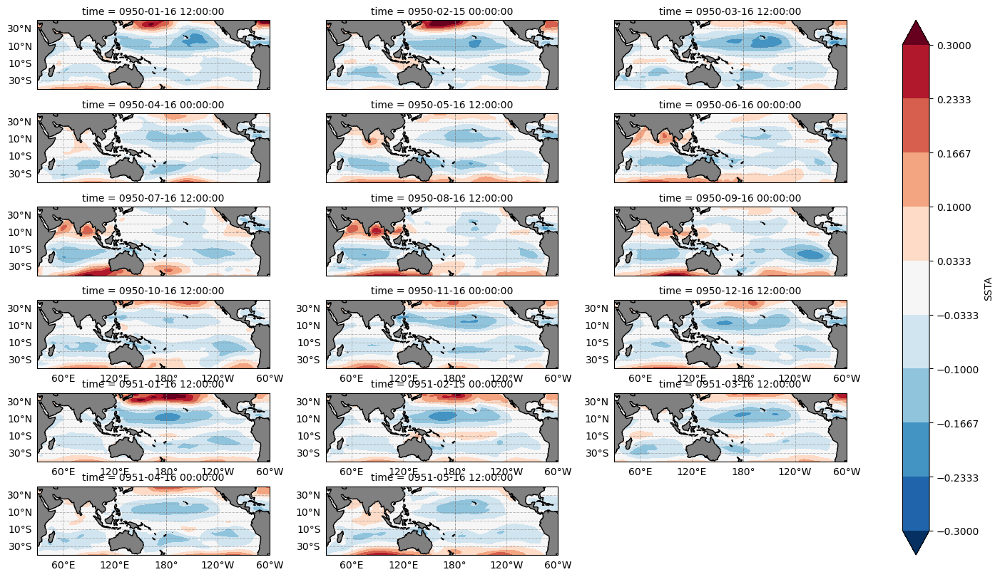

In [24]:
lat_limits = (-40, 40)
lon_limits = (-150, 120) 
fg = EPu[0:17].plot.contourf(col="time", col_wrap = 3, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(16,8), vmin = -0.3, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SSTA'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3,4,5,6,7,8]:
        gl.bottom_labels = False
    if i in [1,2,4,5,7,8]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

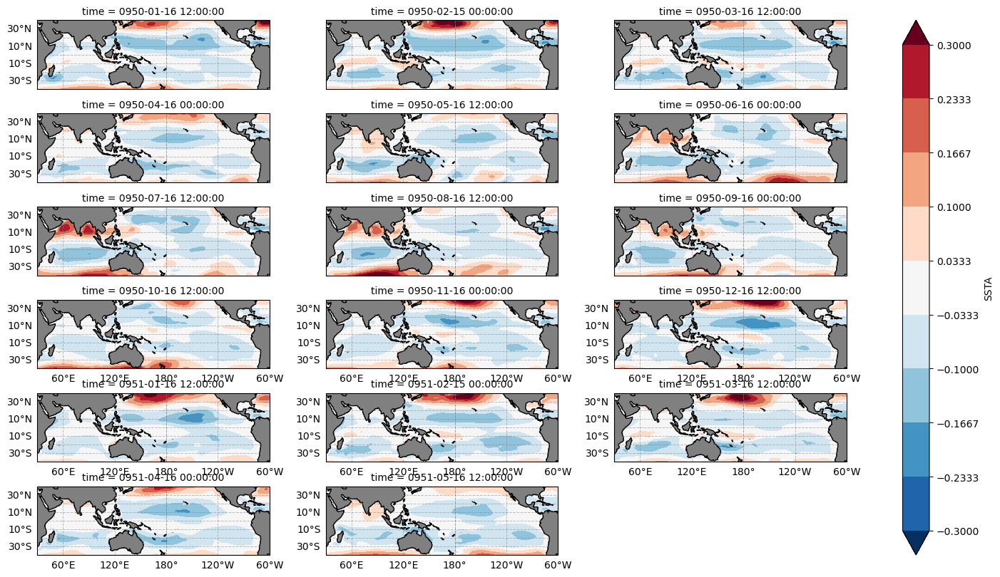

In [25]:
lat_limits = (-40, 40)
lon_limits = (-150, 120) 
fg = CPu[0:17].plot.contourf(col="time", col_wrap = 3, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(16,8), vmin = -0.3, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SSTA'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3,4,5,6,7,8]:
        gl.bottom_labels = False
    if i in [1,2,4,5,7,8]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

In [ ]:
lat_limits = (-40, 40)
lon_limits = (-150, 120) 
fg = (EPa-CPa)[0:8].plot.contourf(col="time", col_wrap = 3, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(16,8), vmin = -0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SSTA'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3,4,5,6,7,8]:
        gl.bottom_labels = False
    if i in [1,2,4,5,7,8]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

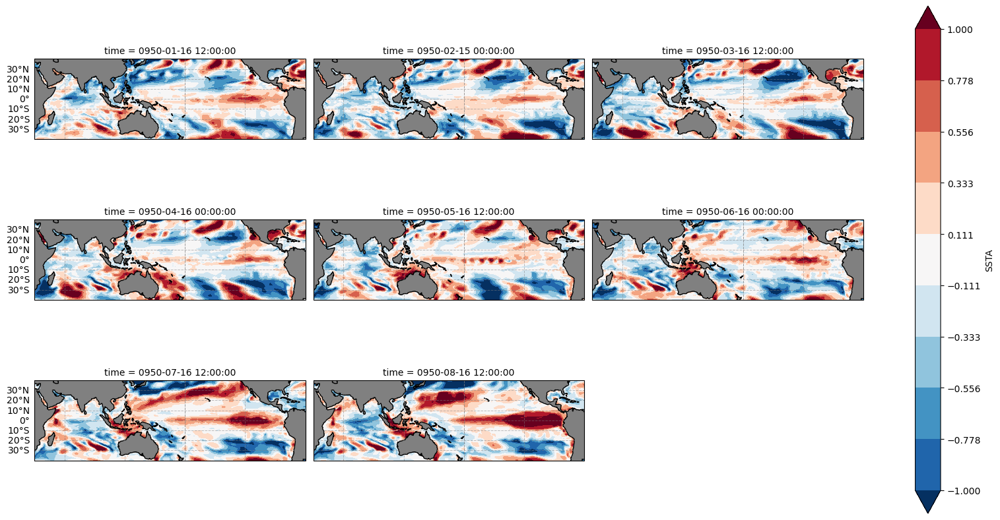

In [115]:
lat_limits = (-40, 40)
lon_limits = (-150, 120) 
fg = EPa[0:8].plot.contourf(col="time", col_wrap = 3, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(16,8), vmin = -, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SSTA'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3,4,5,6,7,8]:
        gl.bottom_labels = False
    if i in [1,2,4,5,7,8]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

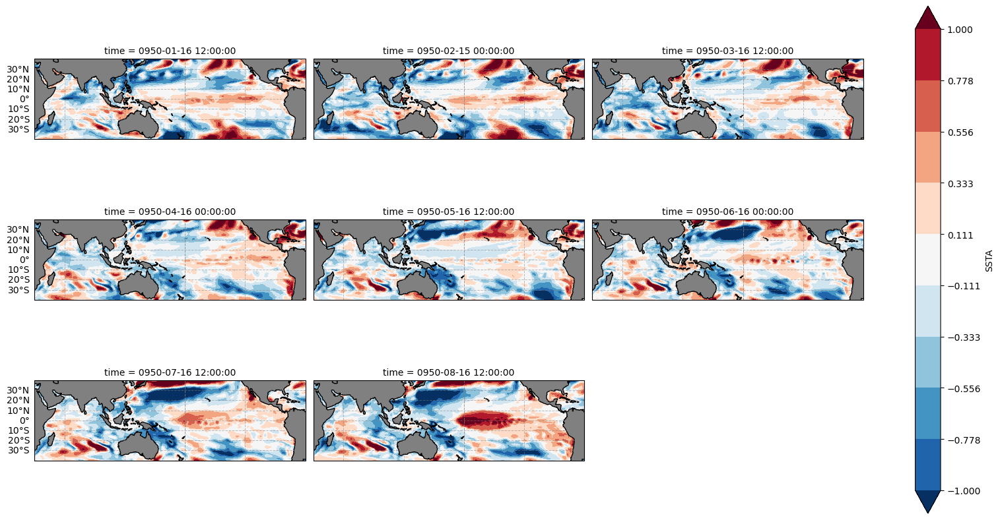

In [114]:
lat_limits = (-40, 40)
lon_limits = (-150, 120) 
fg = CPa[0:8].plot.contourf(col="time", col_wrap = 3, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(16,8), vmin = -1, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SSTA'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3,4,5,6,7,8]:
        gl.bottom_labels = False
    if i in [1,2,4,5,7,8]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

In [29]:
#look at IOD

Text(0.5, 1.0, 'DMI')

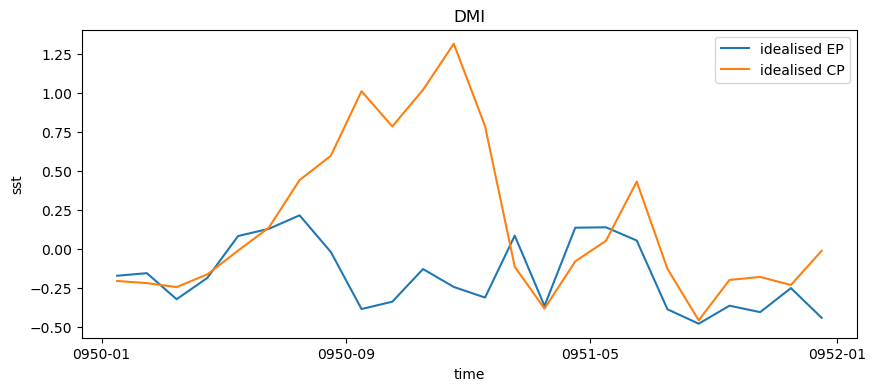

In [30]:
plt.figure(figsize = (10,4))
DMI_exp(EPa).plot(label = "idealised EP")
DMI_exp(CPa).plot(label = "idealised CP")
plt.legend()
plt.title("DMI")

Text(0.5, 1.0, 'SETIO')

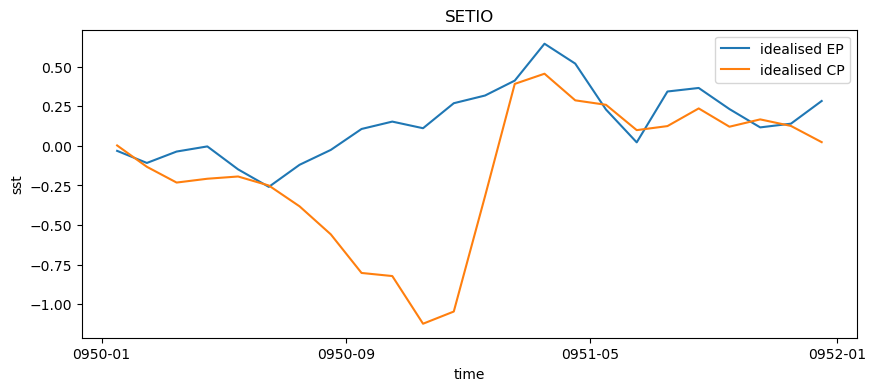

In [31]:
plt.figure(figsize = (10,4))
SE_exp(EPa).plot(label = "idealised EP")
SE_exp(CPa).plot(label = "idealised CP")
plt.legend()
plt.title("SETIO")

Text(0.5, 1.0, 'WTIO')

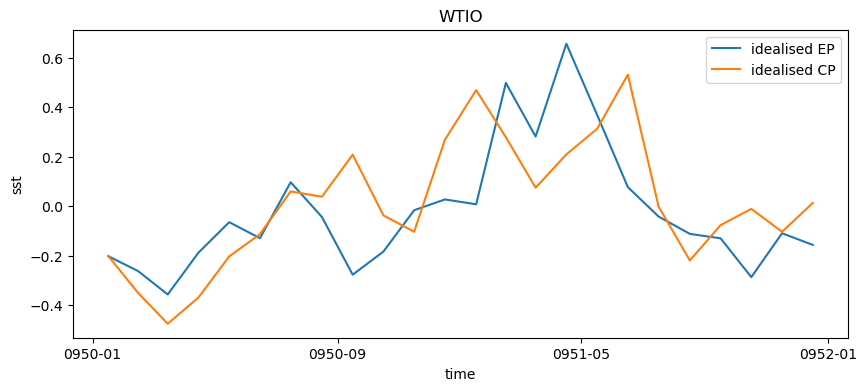

In [32]:
plt.figure(figsize = (10,4))
WT_exp(EPa).plot(label = "idealised EP")
WT_exp(CPa).plot(label = "idealised CP")
plt.legend()
plt.title("WTIO")

Text(0.5, 1.0, 'Nino4')

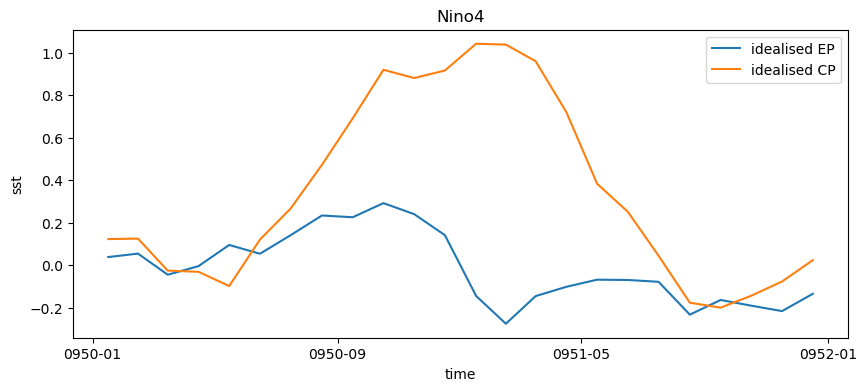

In [33]:
plt.figure(figsize = (10,4))
NINO4(EPa).plot(label = "idealised EP")
NINO4(CPa).plot(label = "idealised CP")
plt.legend()
plt.title("Nino4")

Text(0.5, 1.0, 'Nino3')

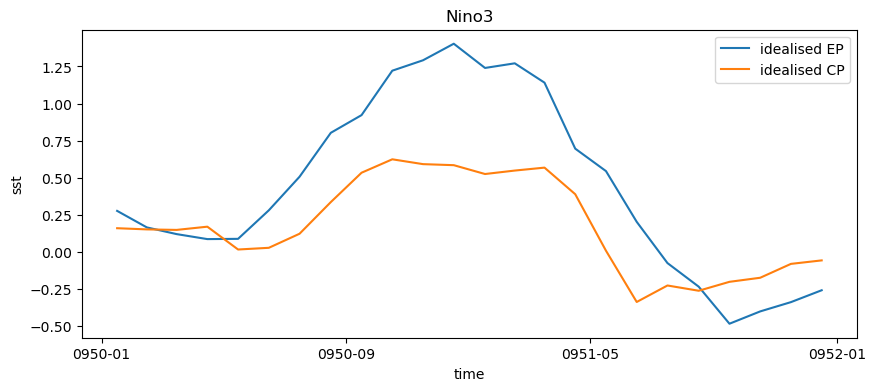

In [34]:
plt.figure(figsize = (10,4))
NINO3(EPa).plot(label = "idealised EP")
NINO3(CPa).plot(label = "idealised CP")
plt.legend()
plt.title("Nino3")

Text(0.5, 1.0, 'Nino34')

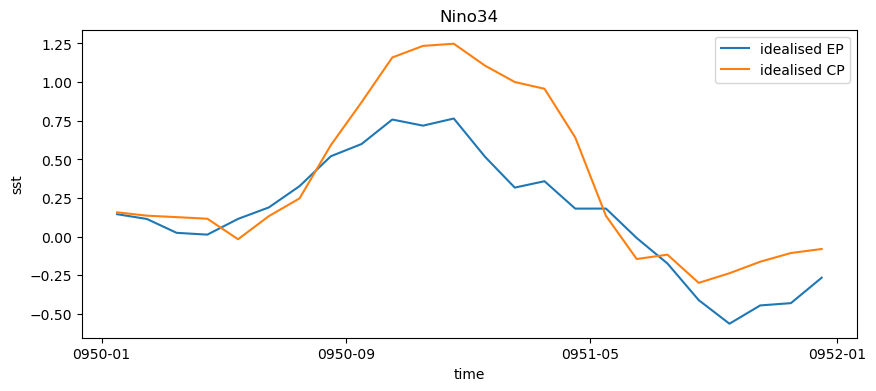

In [35]:
plt.figure(figsize = (10,4))
NINO34(EPa).plot(label = "idealised EP")
NINO34(CPa).plot(label = "idealised CP")
plt.legend()
plt.title("Nino34")

Text(0.5, 1.0, 'IOBM')

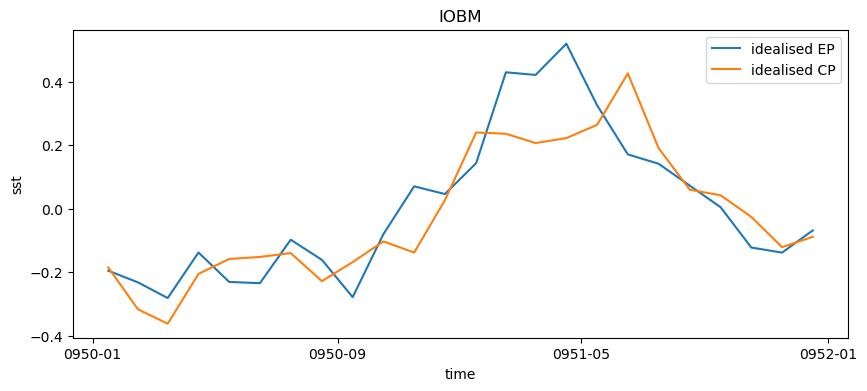

In [36]:
plt.figure(figsize = (10,4))
IOBM(EPa).plot(label = "idealised EP")
IOBM(CPa).plot(label = "idealised CP")
plt.legend()
plt.title("IOBM")

In [37]:
#look at wind patterns